# App Rating Predictor
## Building an app rating predictor using data scraped from the android market
### We have scraped some apps from the Google PlayStore, and the primary goals of our project are:
- predict the rating
- predict installation count
- predict whether the app is free or paid 
- predict whether is it ad-supported

But before we start with the explanatory data analysis, we need to do data cleaning/preprocessing because our dataset is VERY UNSTRUCTURED and RAW.

# Table of contents
1. <a href='#data cleaning'>Data Cleaning</a>
2. <a href='#memory optimization'>Memory Optimization</a>
3. [EDA](#EDA) 
    1. <a href='#rating EDA'>RATING EDA</a> 
    2. <a href='#installs EDA'>INSTALLS EDA</a> 
    3. <a href='#miscellaneous EDA'>MISCELLANEOUS EDA</a>
        1. <a href='#price EDA'>Price EDA</a>
        2. <a href='#category EDA'>Category EDA</a>
        3. <a href='#size EDA'>Size EDA</a>
        4. <a href='#content rating EDA'>Content Rating EDA</a>
4. <a href='#singapore EDA'>Singapore EDA</a>
5. <a href='#fang EDA'>FANG EDA</a>
6. <a href='#geospatial analysis'>Geospatial Analysis</a>

### Import packages

In [343]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sb
sb.set() # set the default Seaborn style for graphics
pd.set_option("display.max_columns", None) #Show all columns, or else some will just be "..."

import plotly.express as px # shows basic statistics of the figure
from dython import nominal # Use for calculating correlation between variables. Including between categorical and numerical variables
import matplotlib.pyplot as plt # we only need pyplot

import plotly.graph_objects as go # Used as trace for subplots
from plotly.subplots import make_subplots

In [344]:
df = pd.read_csv("./input/google_app_scrap.csv")
df.head()

,Unnamed: 0,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,CURRENCY,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,FAMILY_GENRE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,0,Skincare Routine,4.510000,Beauty,topselling_paid,609.0,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,USD,16M,Mento Apps Ltd,23 Stoneleigh Avenue\nBN1 8NP,Everyone,NaN,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13176.0,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,USD,24M,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Teen,NaN,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782877.0,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,USD,201M,"Perfect365, Inc.","Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Everyone,NaN,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,95.0,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,USD,67M,Glowbe LTD,"4103, Limassol Cyprus",Everyone,NaN,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,4,PhiApp,4.233333,Beauty,topgrossing,916.0,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,USD,Varies with device,PhiAcademy GmbH,"Gartengasse 8/8\n1050, Vienna\nAustria",Everyone,NaN,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


<a id = 'data cleaning'></a>
# Data Cleaning

In [345]:
df.describe(include="all")

,Unnamed: 0,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,CURRENCY,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,FAMILY_GENRE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
count,23952.00000,23952,23934.000000,23952,23952,2.393400e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.393400e+04,23952,2.395200e+04,2.395200e+04,23952,23952.000000,23952,23952,23952,19420,23952,0.0,23952,23952,23952,23762,23952,23952
unique,NaN,18496,NaN,48,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,NaN,NaN,2,NaN,1,666,12343,8614,5,NaN,2,2,2,3935,1600,1
top,NaN,Solitaire,NaN,Sports,topselling_free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,000,000+",NaN,NaN,True,NaN,USD,Varies with device,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Everyone,NaN,False,True,False,"Feb 21, 2022",4/3/22,8/3/22
freq,NaN,27,NaN,944,10593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4427,NaN,NaN,18520,NaN,23952,3170,137,137,17530,NaN,12182,14509,23439,44,955,23952
mean,11975.50000,NaN,3.988836,NaN,NaN,3.899129e+05,4.401561e+04,9.365627e+03,1.810578e+04,4.228248e+04,2.758255e+05,1.778189e+04,NaN,1.891777e+07,3.073138e+07,NaN,1.422892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,6914.49116,NaN,1.044631,NaN,NaN,3.676933e+06,7.961011e+05,1.007322e+05,1.726730e+05,3.569045e+05,2.428996e+06,1.179491e+05,NaN,2.201441e+08,2.802337e+08,NaN,8.832669,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.00000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,5987.75000,NaN,3.891892,NaN,NaN,6.412500e+02,5.800000e+01,1.200000e+01,2.300000e+01,5.100000e+01,3.927500e+02,6.400000e+01,NaN,5.000000e+04,5.644300e+04,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,11975.50000,NaN,4.300697,NaN,NaN,8.450000e+03,6.805000e+02,1.900000e+02,3.470000e+02,7.885000e+02,5.698000e+03,5.750000e+02,NaN,5.000000e+05,8.288390e+05,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,17963.25000,NaN,4.561213,NaN,NaN,7.308575e+04,5.809500e+03,1.719250e+03,3.201000e+03,7.650000e+03,5.187900e+04,4.237750e+03,NaN,5.000000e+06,7.747612e+06,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [346]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23952 entries, 0 to 23951
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         23952 non-null  int64  
 1   APP_NAME           23952 non-null  object 
 2   RATING             23934 non-null  float64
 3   CATEGORY           23952 non-null  object 
 4   COLLECTIONS        23952 non-null  object 
 5   RATING_COUNT       23934 non-null  float64
 6   1_STAR_RATINGS     23952 non-null  int64  
 7   2_STAR_RATINGS     23952 non-null  int64  
 8   3_STAR_RATINGS     23952 non-null  int64  
 9   4_STAR_RATINGS     23952 non-null  int64  
 10  5_STAR_RATINGS     23952 non-null  int64  
 11  REVIEW_COUNT       23934 non-null  float64
 12  INSTALLS           23952 non-null  object 
 13  MIN_INSTALLS       23952 non-null  int64  
 14  MAX_INSTALLS       23952 non-null  int64  
 15  FREE               23952 non-null  bool   
 16  PRICE              239

Some initial observations:
1. UNNAMED: 0 column is same as the index
2. There are no values in FAMILY_GENRE
3. All the values in CURRENCY are the same (usd) which indicates the currency of the price of the app
4. The 5 n_STAR_RATING columns does not always sum up to RATING_COUNT
5. SIZE contains string objects with postfix of K, M, G to indicate the size of the app in bytes
6. The formats for columns with date objects are inconsistent

### Remove useless columns that contain same/empty values which won't contribute to our EDA
We will remove:
- `FAMILY_GENRE`
- `Unnamed: 0`
- `CURRENCY`

In [347]:
df = df.drop(columns=['Unnamed: 0', 'FAMILY_GENRE', 'CURRENCY'])
df.columns

Index(['APP_NAME', 'RATING', 'CATEGORY', 'COLLECTIONS', 'RATING_COUNT',
       '1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS',
       '5_STAR_RATINGS', 'REVIEW_COUNT', 'INSTALLS', 'MIN_INSTALLS',
       'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'DEVELOPER',
       'DEVELOPER_ADDRESS', 'CONTENT_RATING', 'AD_SUPPORTED',
       'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'RELEASED_DATE', 'LAST_UPDATED',
       'DAY_SCRAPED'],
      dtype='object')

### Tidy up `RATING_COUNT`
RATING_COUNT is inconsistent. So we will replace the values in `RATING_COUNT` with the sum of `1_STAR_RATING`, `2_STAR_RATING`, `3_STAR_RATING`, `4_STAR_RATING`, `5_STAR_RATING`. We also drop the apps with 0 rating count (the app is too new)

In [348]:
df['RATING_COUNT'] = df[['1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS', '5_STAR_RATINGS']].sum(axis=1)
df = df[df["RATING_COUNT"] != 0]
df.reset_index(inplace=True, drop=True)
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16M,Mento Apps Ltd,23 Stoneleigh Avenue\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24M,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201M,"Perfect365, Inc.","Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67M,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,Varies with device,PhiAcademy GmbH,"Gartengasse 8/8\n1050, Vienna\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Clean `SIZE`
`SIZE` are string objects, we will convert them into integers for integer operations in EDA. <br>
For example: 12M -> 12000000, 12K -> 12000, varies with device -> NaN (handle this later)

In [349]:
df["SIZE"] = df["SIZE"].str.replace("Varies with device","-1") #replacing "Varies with device" with -1 
df["SIZE"] = df["SIZE"].str.replace(",","") #replacing ',' with an empty string

#changing k to (10**3), M to (10**6) and G to (10**9)
df["SIZE"] = (df["SIZE"].replace(r'[kMG]+$', '', regex=True).astype(float) * \
                   df["SIZE"].str.extract(r'[\d\.]+([kMG]+)', expand=False)
                   .fillna(1)
                   .replace(['k','M','G'], [10**3, 10**6,10**9]).astype(int))
df['SIZE'] = df['SIZE'].astype('int64') #converting float to int64
df.loc[df['SIZE'] == -1, 'SIZE'] = np.nan # convert -1 to NaN
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\n1050, Vienna\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Reformat dates

`RELEASED_DATE`, `LAST_UPDATED`, `DAY_SCRAPED` are string objects, and their format are inconsistent and different. Hence, we will reformat them into **"dd/mm/yyyy"**.

In [350]:
#Convert strings to datetime
df['RELEASED_DATE'] = pd.to_datetime(df['RELEASED_DATE'])
df['LAST_UPDATED'] = pd.to_datetime(df['LAST_UPDATED'], format="%d/%m/%y")
df['DAY_SCRAPED'] = pd.to_datetime(df['DAY_SCRAPED'], format="%d/%m/%y")

#reformat date
df['RELEASED_DATE'] = df['RELEASED_DATE'].dt.strftime('%d/%m/%Y')
df['LAST_UPDATED'] = df['LAST_UPDATED'].dt.strftime('%d/%m/%Y')
df['DAY_SCRAPED'] = df['DAY_SCRAPED'].dt.strftime('%d/%m/%Y')
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\nBN1 8NP,Everyone,False,False,False,13/08/2018,14/02/2022,08/03/2022
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Teen,False,True,False,22/05/2014,03/03/2022,08/03/2022
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Everyone,True,True,False,19/02/2013,04/03/2022,08/03/2022
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,02/12/2020,20/02/2022,08/03/2022
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\n1050, Vienna\nAustria",Everyone,False,True,False,13/03/2015,20/01/2022,08/03/2022


### Dealing with NULL values

In [351]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22824 entries, 0 to 22823
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   APP_NAME           22824 non-null  object 
 1   RATING             22824 non-null  float64
 2   CATEGORY           22824 non-null  object 
 3   COLLECTIONS        22824 non-null  object 
 4   RATING_COUNT       22824 non-null  int64  
 5   1_STAR_RATINGS     22824 non-null  int64  
 6   2_STAR_RATINGS     22824 non-null  int64  
 7   3_STAR_RATINGS     22824 non-null  int64  
 8   4_STAR_RATINGS     22824 non-null  int64  
 9   5_STAR_RATINGS     22824 non-null  int64  
 10  REVIEW_COUNT       22824 non-null  float64
 11  INSTALLS           22824 non-null  object 
 12  MIN_INSTALLS       22824 non-null  int64  
 13  MAX_INSTALLS       22824 non-null  int64  
 14  FREE               22824 non-null  bool   
 15  PRICE              22824 non-null  float64
 16  SIZE               197

By observation and previous cleaning steps, there are 6 columns with NULL values which are:
- REVIEW_COUNT
- RATING
- RATING_COUNT
- RELEASED_DATE
- SIZE
- DEVELOPER_ADDRESS 

For `REVIEW_COUNT`, `RATING`, `RATING_COUNT`, the values are null value most likely because the app is too new and no customers have done any review on them, so **remove rows with NULL column values** from the dataset.

In [352]:
df = df.dropna(axis=0, subset=['REVIEW_COUNT', 'RATING', 'RATING_COUNT'])
df = df.reset_index(drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22824 entries, 0 to 22823
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   APP_NAME           22824 non-null  object 
 1   RATING             22824 non-null  float64
 2   CATEGORY           22824 non-null  object 
 3   COLLECTIONS        22824 non-null  object 
 4   RATING_COUNT       22824 non-null  int64  
 5   1_STAR_RATINGS     22824 non-null  int64  
 6   2_STAR_RATINGS     22824 non-null  int64  
 7   3_STAR_RATINGS     22824 non-null  int64  
 8   4_STAR_RATINGS     22824 non-null  int64  
 9   5_STAR_RATINGS     22824 non-null  int64  
 10  REVIEW_COUNT       22824 non-null  float64
 11  INSTALLS           22824 non-null  object 
 12  MIN_INSTALLS       22824 non-null  int64  
 13  MAX_INSTALLS       22824 non-null  int64  
 14  FREE               22824 non-null  bool   
 15  PRICE              22824 non-null  float64
 16  SIZE               197

As for `RELEASED_DATE`, fill the **null values with the median**.

But first we create to new columns to replace `RELEASED_DATE` and `LAST_UPDATED` to contain numerical values instead of Date object.

In [353]:
for i in range(df.shape[0]):
    if (pd.isnull(df.loc[i, "LAST_UPDATED"])):
        df.loc[i, "DAYS_SINCE_UPDATE"] = np.nan
        continue
    date_from = pd.to_datetime(df.loc[i, "LAST_UPDATED"], format="%d/%m/%Y").date()
    date_till = pd.to_datetime(df.loc[i, "DAY_SCRAPED"], format="%d/%m/%Y").date()
    date_elasped = np.int64((date_till-date_from).days)
    df.loc[i, "DAYS_SINCE_UPDATE"] = date_elasped
    
    if (pd.isnull(df.loc[i, "RELEASED_DATE"])):
        df.loc[i, "DAYS_SINCE_RELEASED"] = np.nan
        continue
    
    date_from = pd.to_datetime(df.loc[i, "RELEASED_DATE"], format="%d/%m/%Y").date()
    date_till = pd.to_datetime(df.loc[i, "DAY_SCRAPED"], format="%d/%m/%Y").date()
    date_elasped = np.int64((date_till-date_from).days)
    df.loc[i, "DAYS_SINCE_RELEASED"] = date_elasped
    
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\nBN1 8NP,Everyone,False,False,False,13/08/2018,14/02/2022,08/03/2022,22.0,1303.0
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Teen,False,True,False,22/05/2014,03/03/2022,08/03/2022,5.0,2847.0
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Everyone,True,True,False,19/02/2013,04/03/2022,08/03/2022,4.0,3304.0
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,02/12/2020,20/02/2022,08/03/2022,16.0,461.0
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\n1050, Vienna\nAustria",Everyone,False,True,False,13/03/2015,20/01/2022,08/03/2022,47.0,2552.0


Filling na values of `DAYS_SINCE_RELEASED`, `DAYS_SINCE_UPDATE`, `SIZE` with its median

In [354]:
median_dsr = df["DAYS_SINCE_RELEASED"].median()
median_dsu = df["DAYS_SINCE_UPDATE"].median()
median_size = df["SIZE"].median()
df["DAYS_SINCE_RELEASED"].fillna(median_dsr, inplace=True)
df["DAYS_SINCE_UPDATE"].fillna(median_dsu, inplace=True)
df["SIZE"].fillna(median_size, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22824 entries, 0 to 22823
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   APP_NAME             22824 non-null  object 
 1   RATING               22824 non-null  float64
 2   CATEGORY             22824 non-null  object 
 3   COLLECTIONS          22824 non-null  object 
 4   RATING_COUNT         22824 non-null  int64  
 5   1_STAR_RATINGS       22824 non-null  int64  
 6   2_STAR_RATINGS       22824 non-null  int64  
 7   3_STAR_RATINGS       22824 non-null  int64  
 8   4_STAR_RATINGS       22824 non-null  int64  
 9   5_STAR_RATINGS       22824 non-null  int64  
 10  REVIEW_COUNT         22824 non-null  float64
 11  INSTALLS             22824 non-null  object 
 12  MIN_INSTALLS         22824 non-null  int64  
 13  MAX_INSTALLS         22824 non-null  int64  
 14  FREE                 22824 non-null  bool   
 15  PRICE                22824 non-null 

Drop `RELEASED_DATE`, `LAST_UPDATED`, `DAY_SCRAPED`, `COLLECTIONS`, and `MIN_INSTALLS` because we dont need them anymore

In [355]:
df = df.drop(columns=['RELEASED_DATE', 'LAST_UPDATED', 'DAY_SCRAPED', 'COLLECTIONS', 'MIN_INSTALLS'])
df.columns

Index(['APP_NAME', 'RATING', 'CATEGORY', 'RATING_COUNT', '1_STAR_RATINGS',
       '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS', '5_STAR_RATINGS',
       'REVIEW_COUNT', 'INSTALLS', 'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE',
       'DEVELOPER', 'DEVELOPER_ADDRESS', 'CONTENT_RATING', 'AD_SUPPORTED',
       'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'DAYS_SINCE_UPDATE',
       'DAYS_SINCE_RELEASED'],
      dtype='object')

### Dealing with Addresses

The raw address of developers might be hard to use for eda, we will generate a new feature `COUNTRY` that holds the country the developer originated.

First, import the dataset of predicted country of each developer address that we generated using **Google Maps API**.

In [356]:
country_df = pd.read_csv("./input/developer_country.csv")
country_df.head()

,index,DEVELOPER_ADDRESS,COUNTRY
0,0,23 Stoneleigh Avenue\r\nBN1 8NP,United Kingdom
1,1,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Poland
2,2,"Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Usa
3,3,"4103, Limassol Cyprus",Cyprus
4,4,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Austria


Remove # from each row in `DEVELOPER_ADDRESS` column to match the format of mapping in the country_df

In [357]:
for i in range(df.shape[0]):
    developer_addr = df.loc[i, "DEVELOPER_ADDRESS"]
    if (pd.isnull(developer_addr)):
        continue
    df.loc[i, "DEVELOPER_ADDRESS"] = developer_addr.replace("#", " ")

# Map to country
df['COUNTRY']=df[['DEVELOPER_ADDRESS']].merge(country_df,how='left').COUNTRY
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,COUNTRY
0,Skincare Routine,4.510000,Beauty,598,34,11,23,65,465,89.0,"10,000+",17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\nBN1 8NP,Everyone,False,False,False,22.0,1303.0,NaN
1,Booksy Biz: For Businesses,4.313544,Beauty,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Teen,False,True,False,5.0,2847.0,NaN
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Everyone,True,True,False,4.0,3304.0,NaN
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,93,38,6,0,2,47,29.0,"10,000+",29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,16.0,461.0,Cyprus
4,PhiApp,4.233333,Beauty,914,122,15,61,45,671,26.0,"100,000+",302978,True,0.00,47000000.0,PhiAcademy GmbH,"Gartengasse 8/8\n1050, Vienna\nAustria",Everyone,False,True,False,47.0,2552.0,NaN


Reposition the `COUNTRY` column

In [358]:
df.insert(17, 'COUNTRY', df.pop('COUNTRY'))
df["COUNTRY"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 22824 entries, 0 to 22823
Series name: COUNTRY
Non-Null Count  Dtype 
--------------  ----- 
6510 non-null   object
dtypes: object(1)
memory usage: 178.4+ KB


There are 6510 apps with predicted developer country, which means more than half the apps do not have predicted country/registered country.

We will only use this info for eda only

### Sort the dataset by the `APP_NAME`

In [359]:
df.sort_values("APP_NAME", inplace = True)
df.reset_index(drop=True, inplace=True)
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\n73-110 Stargard Szcz...,NaN,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
3,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
4,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\nToronto, Ontario, Ca...",NaN,Teen,False,True,False,952.0,1275.0


### Drop duplicated apps that has different categories, but turn their `CATEGORY` column into a String(array) 

In [360]:
temp_df = df.groupby("APP_NAME")["CATEGORY"].apply(list)
df.drop_duplicates(subset ="APP_NAME", keep = "first", inplace = True)
df.reset_index(drop=True, inplace=True)
i = 0
for tags in temp_df:
    to_add = []
    [to_add.append(x) for x in tags if x not in to_add]
    df.loc[i, "CATEGORY"] = str(to_add)
    i+=1
df.head() 

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,['Puzzle'],975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\n73-110 Stargard Szcz...,NaN,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,['Racing'],229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,['Role Playing'],14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\nToronto, Ontario, Ca...",NaN,Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17.0,1026.0


In [361]:
count = 0
hashMap = {}
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories not in hashMap):
        hashMap[num_of_categories] = 1
    else:
        hashMap[num_of_categories] +=1
# iterate hashmap
for k, v in hashMap.items():
    print(f"{v} apps have {k} categories")

17454 apps have 1 categories
21 apps have 2 categories
1 apps have 4 categories


### Modify `CATEGORY` column

In [362]:
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories == 4):
        app_with_four_cat = pd.DataFrame(df.loc[i, ])
        break
app_name_with_four_cat = app_with_four_cat[i]["APP_NAME"]
app_name_with_four_cat

'HD Video Screen Mirroring'

We will handle the apps that belongs to more than 1 category (Pick one of the category of the 2, we drop the one with 4 category since its stats doesnt matter anyways)

In [363]:
count = 0
sanity_check_df = []
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories == 2):
        df.loc[i, "CATEGORY"] = str(temp[0])
        sanity_check_df.append(df.loc[i, ])
        count +=1
print("There are", count, "apps that belongs to more than one category.")
sanity_check_df = pd.DataFrame(sanity_check_df)
sanity_check_df.shape

There are 21 apps that belongs to more than one category.


(21, 24)

In [364]:
#Drop the entry that belongs to 4 categories
df = df[df["APP_NAME"] != app_name_with_four_cat]
df.reset_index(inplace=True, drop=True)
#Remove the brackets around `CATEGORY` row values
for i in range(df.shape[0]):
    category = df.loc[i, "CATEGORY"]
    if (category[-1] != "]"):
        df.loc[i, "CATEGORY"] = category[2:-1]
    else:
        df.loc[i, "CATEGORY"] = category[2:-2]
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\n73-110 Stargard Szcz...,NaN,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\nToronto, Ontario, Ca...",NaN,Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17.0,1026.0


<a id = 'memory optimization'></a>
# Memory Optimization

In [365]:
df.dtypes

APP_NAME                object
RATING                 float64
CATEGORY                object
RATING_COUNT             int64
1_STAR_RATINGS           int64
2_STAR_RATINGS           int64
3_STAR_RATINGS           int64
4_STAR_RATINGS           int64
5_STAR_RATINGS           int64
REVIEW_COUNT           float64
INSTALLS                object
MAX_INSTALLS             int64
FREE                      bool
PRICE                  float64
SIZE                   float64
DEVELOPER               object
DEVELOPER_ADDRESS       object
COUNTRY                 object
CONTENT_RATING          object
AD_SUPPORTED              bool
IN_APP_PURCHASES          bool
EDITORS_CHOICE            bool
DAYS_SINCE_UPDATE      float64
DAYS_SINCE_RELEASED    float64
dtype: object

In [366]:
def to_float32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("float32")
        
def to_int32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("int32") 

def to_int16(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("int16") 

In [367]:
to_float32(df, ["RATING", "REVIEW_COUNT", "PRICE"])
to_int32(df, ["1_STAR_RATINGS", "2_STAR_RATINGS", "3_STAR_RATINGS", "4_STAR_RATINGS", "5_STAR_RATINGS"])

In [368]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17475 entries, 0 to 17474
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   APP_NAME             17475 non-null  object 
 1   RATING               17475 non-null  float32
 2   CATEGORY             17475 non-null  object 
 3   RATING_COUNT         17475 non-null  int64  
 4   1_STAR_RATINGS       17475 non-null  int32  
 5   2_STAR_RATINGS       17475 non-null  int32  
 6   3_STAR_RATINGS       17475 non-null  int32  
 7   4_STAR_RATINGS       17475 non-null  int32  
 8   5_STAR_RATINGS       17475 non-null  int32  
 9   REVIEW_COUNT         17475 non-null  float32
 10  INSTALLS             17475 non-null  object 
 11  MAX_INSTALLS         17475 non-null  int64  
 12  FREE                 17475 non-null  bool   
 13  PRICE                17475 non-null  float32
 14  SIZE                 17475 non-null  float64
 15  DEVELOPER            17475 non-null 

In order to improve our productivity, we have converted some fields to a smaller version of the variable type. Doing so, helps us remove unnecessary storage and enable us to accelerate our code runs.

In [369]:
# exporting the cleaned data into a csv file
file_path = "./output/google_app_scrap_cleaned.csv"
df.to_csv(path_or_buf=file_path, index=False);

# EDA

Before we start our exploratory data analysis, we had split our features into categorical and numerical data

Categorical: `CATEGORY`, `DEVELOPER`, `CONTENT_RATING`, `AD_SUPPORTED`, `IN_APP_PURCHASES`,  `EDITORS_CHOICE`, `FREE`, `COUNTRY`, `INSTALLS`,

Numerical: `DAYS_SINCE_UPDATE`, `DAYS_SINCE_RELEASED`, `RATING`, `RATING_COUNT`, `SIZE`, `PRICE`, `MAX_INSTALLS`, `REVIEW_COUNT`, `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS`, 

Some features to note:
1. `APP_NAME` - the values are all unique which indicate the name of the app (useless in model building)
2. `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS` - to check the rating count and for visualization purposes
3. `MIN_INSTALLS` - contains the lower bound of the number of installations, it act as a benchmark for `INSTALLS` to tell which category of installs the app falls into 
4. `DEVELOPER_ADDRESS` - we are using `COUNTRY` so we can drop the developer's address
5. `DEVELOPER` - the developer column contains unique values so we can drop them as well
6. `COUNTRY` - for visualization purposes
7. `MAX_INSTALLS` and `INSTALLS` holds the number of installs/installation range of the app, just that `MAX_INSTALLS` is numerical while `INSTALLS` is categorical

Responses to consider:
1. Rating (Numerical)
2. Content Rating (Cat)
3. Installs (Cat) 

Rating
- predictor

cat:CATEGORY, CONTENT_RATING, AD_SUPPORTED, IN_APP_PURCHASES,  EDITORS_CHOICE, FREE, INSTALLS, SIZE(turn to cat alr)

num: DAYS_SINCE_UPDATE, DAYS_SINCE_RELEASED, RATING_COUNT, REVIEW_COUNT

In [370]:
df_cleaned = df.copy()
df_cleaned.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\n73-110 Stargard Szcz...,NaN,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\nToronto, Ontario, Ca...",NaN,Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17.0,1026.0


### Roadmap
We will do our EDA mainly on `RATING` and `INSTALLS`. <br>
For `RATING`, we will work with:
- `EDITORS_CHOICE`
- `FREE`
- `PRICE`
- `AD_SUPPORTED`
- `CONTENT_RATING`
- `IN_APP_PURCHASES`
- `DAYS_SINCE_UPDATE`

For `INSTALLS`, we will cherry pick those variables that have high association values:
- `REVIEW_COUNT`
- `FREE`
- `AD_SUPPORTED`
- `RATING_COUNT`
- `IN_APP_PURCHASES`

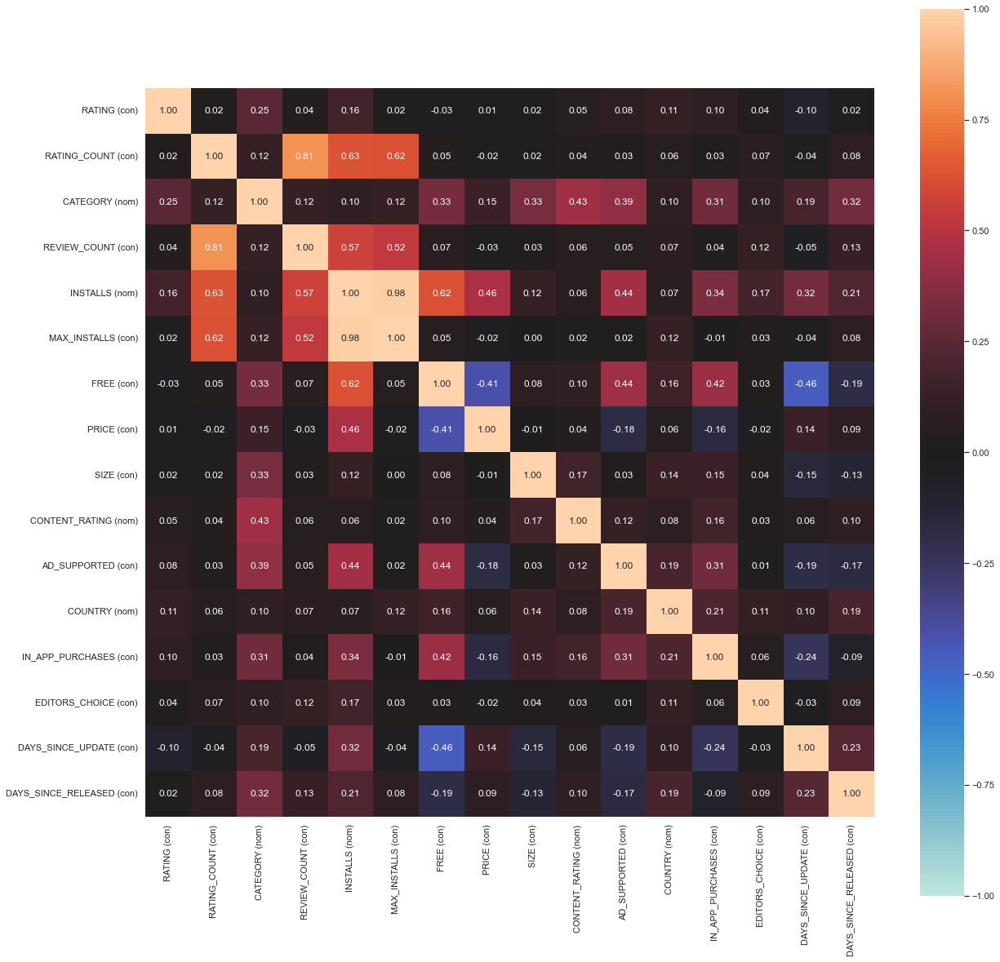

In [371]:
jointDf = df_cleaned[['RATING','RATING_COUNT', 'CATEGORY', 'REVIEW_COUNT', 'INSTALLS', 'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'CONTENT_RATING', 'AD_SUPPORTED', 'COUNTRY', 'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'DAYS_SINCE_UPDATE', 'DAYS_SINCE_RELEASED']]
nominal.associations(jointDf, figsize = (20, 20), mark_columns=True);


Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map. <br>
It will then calculate the correlation/strength-of-association of features in data-set with both categorical and continuous features.

### Find outliers function
#### The function below will find the number of outliers and the upper and lower limit. And remove those outliers and return the new dataframe. 
#### The second function does the same thing but it will take in 2 fields.

In [372]:
def Outliers(frame, col):
    Q1 = frame[col].quantile(0.25)
    Q3 = frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    low_lim = Q1 - 1.5*IQR    
    count = 0
    for x in frame[col]:
        if ((x > upp_lim) or (x < low_lim)): count += 1;
    print(f"There is {count} outliers in \"{col}\" field.")
    print(f"{col} upper limit: ", upp_lim)
    print(f"{col} lower limit: ", low_lim)
    return frame[frame[col] < upp_lim]

def Outliers2(frame, col1, col2):
    Q1a = frame[col1].quantile(0.25)
    Q3a = frame[col1].quantile(0.75)
    IQRa = Q3a-Q1a
    upp_lim1 = Q3a + 1.5*IQRa
    low_lim1 = Q1a - 1.5*IQRa    
    count1 = 0
    for x in frame[col1]:
        if ((x > upp_lim1) or (x < low_lim1)): count1 += 1;
    print(f"There is {count1} outliers in \"{col1}\" field.")
    print(f"{col1} upper limit: ", upp_lim1)
    print(f"{col1} lower limit: ", low_lim1)
    
    Q1b = frame[col2].quantile(0.25)
    Q3b = frame[col2].quantile(0.75)
    IQRb = Q3b-Q1b
    upp_lim2 = Q3b + 1.5*IQRb
    low_lim2 = Q1b - 1.5*IQRb    
    count2 = 0
    for x in frame[col2]:
        if ((x > upp_lim2) or (x < low_lim2)): count2 += 1;
    print(f"There is {count2} outliers in \"{col2}\" field.")
    print(f"{col2} upper limit: ", upp_lim2)
    print(f"{col2} lower limit: ", low_lim2)
    return frame[(frame[col1] < upp_lim1) & (frame[col2] < upp_lim2)]

<a id = 'rating EDA'></a>
## `RATING` EDA

### What is the rating distribution like on Google PlayStore? 

In [373]:
ratings = df_cleaned[['1_STAR_RATINGS','2_STAR_RATINGS','3_STAR_RATINGS','4_STAR_RATINGS','5_STAR_RATINGS']]
rating_count = pd.DataFrame(ratings.sum(axis=0))
rating_count.columns = ['Count']
fig = px.bar(rating_count, x='Count', width=800, height=400)
fig.show()

### Let's find the average rating of an app.


In [374]:
fig = px.histogram(df_cleaned, x = "RATING", width=800, height=400)
print("The average rating of an app is: ", df_cleaned['RATING'].mean())
fig.show()

The average rating of an app is:  4.158705


### `RATING` VS `EDITORS_CHOICE`

In [375]:
fig = px.box(df_cleaned, x = "RATING", color = "EDITORS_CHOICE", width=800, height=400)
fig.show()

It seems like we can be confident that those with rating < 3 are not editor's choice. But from rating > 4 onwards, we can't make accurate prediction from what we have now. 

### `RATING` VS `FREE`


What's the distribution of free apps and paid apps?

In [376]:
fig1 = go.Histogram(x = df_cleaned["FREE"])
fig2 = go.Box(x = df_cleaned["RATING"], y = df_cleaned["FREE"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

### `RATING` VS `AD_SUPPORTED`

In [377]:
fig1 = go.Histogram(x = df_cleaned["AD_SUPPORTED"])
fig2 = go.Box(x = df_cleaned["RATING"], y = df_cleaned["AD_SUPPORTED"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

Suprisingly, the distribution between these 2 are very even, and it's beneficial to our machine learning later.

### `RATING` VS `CONTENT_RATING` 

In [378]:
print(df_cleaned["CONTENT_RATING"].value_counts())
fig1 = go.Histogram(x = df_cleaned["CONTENT_RATING"])
fig2 = go.Box(x = df_cleaned["RATING"], y = df_cleaned["CONTENT_RATING"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

Everyone           12674
Teen                2932
Everyone 10+         988
Mature 17+           854
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


There's a obvious concentration of the app's rating that are for adults only. As for the apps that are for everyone, it's spread out widely across the rating spectrum. 

### `RATING` VS `IN_APP_PURCHASES`

In [379]:
edited_df = Outliers(df_cleaned, "MAX_INSTALLS")
fig1 = go.Histogram(x = edited_df["IN_APP_PURCHASES"])
fig2 = go.Box(x = edited_df["RATING"], y = edited_df["IN_APP_PURCHASES"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

There is 2694 outliers in "MAX_INSTALLS" field.
MAX_INSTALLS upper limit:  14807107.25
MAX_INSTALLS lower limit:  -8781102.75


### `RATING` VS `DAYS_SINCE_UPDATE`

In [380]:
fig1 = go.Box(x = df_cleaned["DAYS_SINCE_UPDATE"], orientation = "h")
fig2 = go.Histogram(x = df_cleaned["DAYS_SINCE_UPDATE"])
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

You might think this is a very skewed data. But in fact, it's very logical. Because apps should be updated frequently, hence the "lower days" section will be more crowded. BUT!
Let's remove the outliers~

In [381]:
edited_df = Outliers(df_cleaned, "DAYS_SINCE_UPDATE")

There is 2458 outliers in "DAYS_SINCE_UPDATE" field.
DAYS_SINCE_UPDATE upper limit:  423.5
DAYS_SINCE_UPDATE lower limit:  -236.5


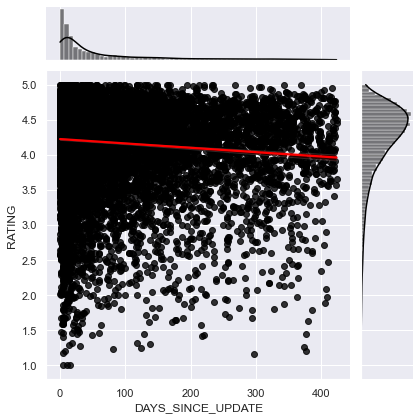

In [382]:
jointDf = edited_df[['DAYS_SINCE_UPDATE', 'RATING']]
sb.jointplot(data = jointDf, x="DAYS_SINCE_UPDATE", y="RATING", kind="reg", color = 'black', line_kws={"color": "red"})

This means that if the longer it took since the last update, we are expecting the app to have a lower rating due to low maintenance of the app.

### `RATING` VS `REVIEW_COUNT`


Text(0.5, 1.0, 'Distribution of Review Count')

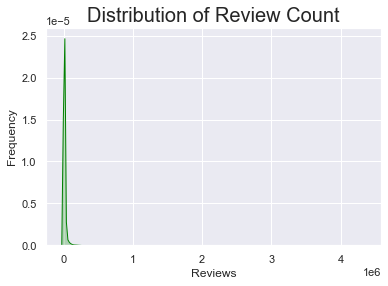

In [383]:
f = sb.kdeplot(df_cleaned['REVIEW_COUNT'], color="Green", shade = True)
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")
plt.title('Distribution of Review Count',size = 20)

This graph so skewed! We need to clean it by removing outliers.

In [384]:
edited_df = Outliers(df_cleaned, "REVIEW_COUNT")

There is 2723 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8073.75
REVIEW_COUNT lower limit:  -4732.25


Text(0.5, 1.0, 'Distribution of Review Count')

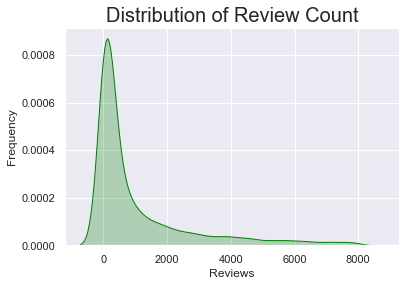

In [385]:
f = sb.kdeplot(edited_df['REVIEW_COUNT'], color="Green", shade = True)
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")
plt.title('Distribution of Review Count',size = 20)

Now, that's more like it. A better presentation of how many reviews get. Although it's still positively skewed...

Text(0.5, 1.0, 'Rating VS Reviews Count')

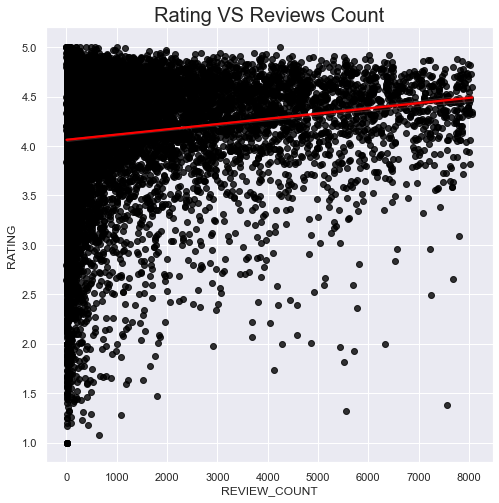

In [386]:
plt.figure(figsize = (8, 8))
sb.regplot(x="REVIEW_COUNT", y="RATING", color = 'black', data=edited_df, line_kws={"color":"red"});
plt.title('Rating VS Reviews Count',size = 20)

### `RATING` VS `SIZE`


In [387]:
def num_plots(df, col, title, xlabel):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(12,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sb.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sb.histplot(x=col, data=df, ax=ax[1], bins = 50)
    ax[1].set_xlabel(xlabel, fontsize=16)
    plt.tight_layout()
    plt.show()

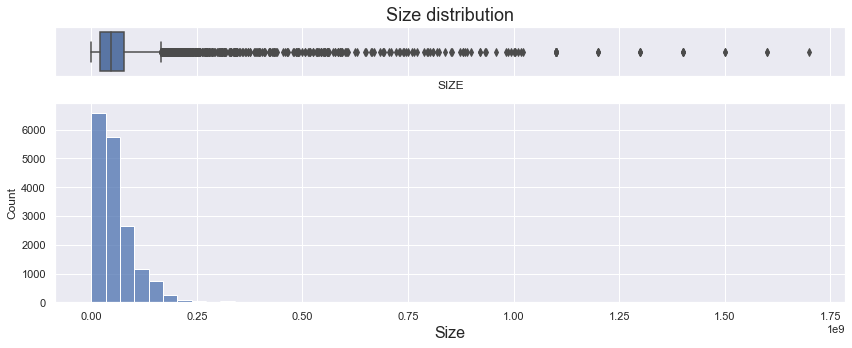

In [388]:
num_plots(df_cleaned, 'SIZE', 'Size distribution', 'Size')

Text(0.5, 1.0, 'Rating VS Size')

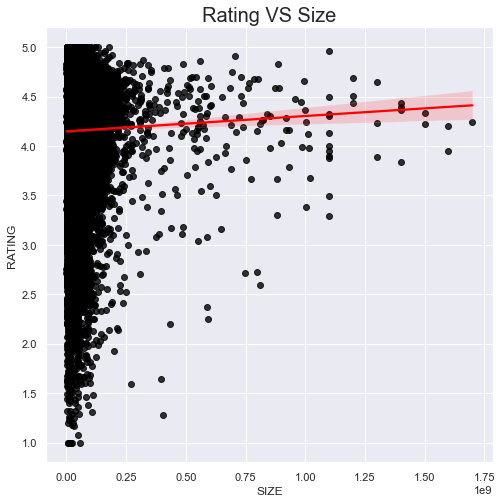

In [389]:
plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="RATING", data=df_cleaned, color = 'black', line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)

Remove outliers.

In [390]:
edited_df = Outliers(df_cleaned, "SIZE")

There is 692 outliers in "SIZE" field.
SIZE upper limit:  165000000.0
SIZE lower limit:  -67000000.0


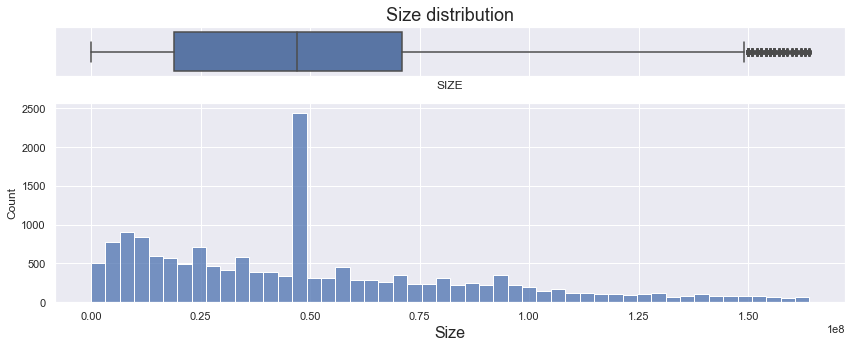

In [391]:
num_plots(edited_df, 'SIZE', 'Size distribution', 'Size')

Text(0.5, 1.0, 'Rating VS Size')

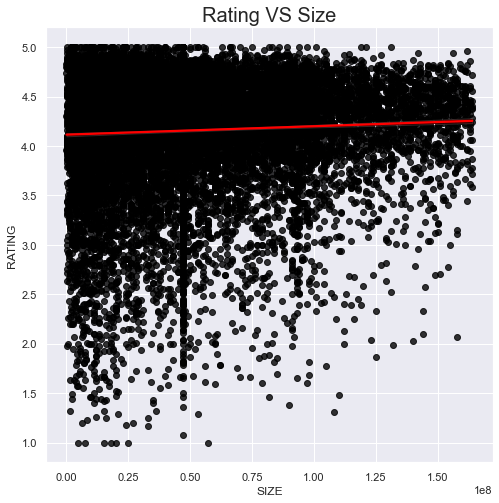

In [392]:
plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="RATING", data=edited_df, color = 'black', line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)

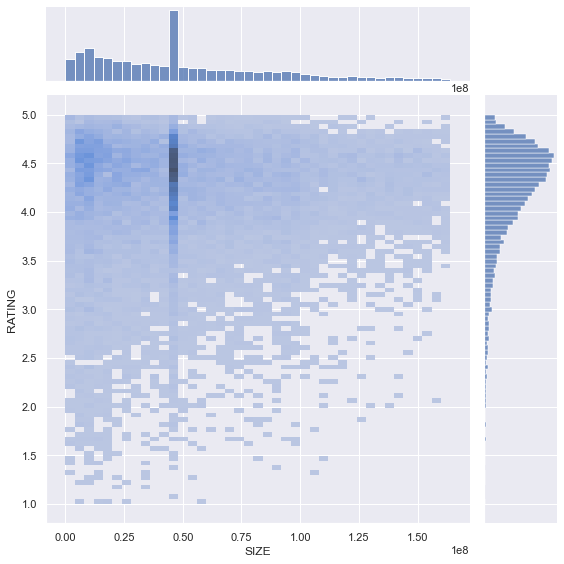

In [393]:
sb.jointplot(data = edited_df, x = "SIZE", y = "RATING", height = 8, kind = "hist")

In this dataset, we have the most frequent data are those around 50 MB and it's rated around 4.50.

### `RATING` VS `PRICE`

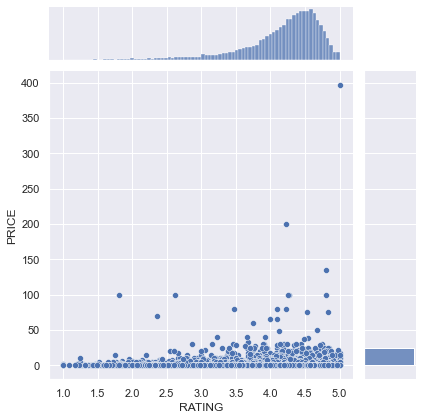

In [394]:
jointDF2 = df_cleaned[["RATING", "PRICE"]]
sb.jointplot(data = jointDF2, x = "RATING", y = "PRICE", height = 6)

Let's observe closely to the distribution within price < 50

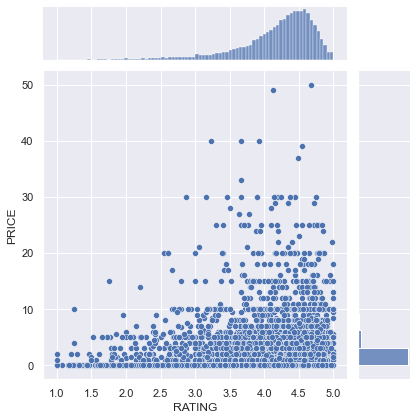

In [395]:
price_less_than_50 = df_cleaned[df_cleaned["PRICE"] < 50]
sb.jointplot(data = price_less_than_50, y = "PRICE", x = "RATING", height=6)

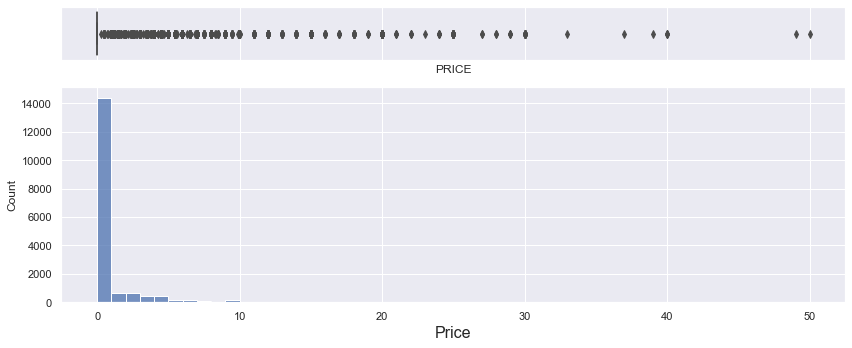

In [396]:
num_plots(price_less_than_50, "PRICE", "", "Price")

<AxesSubplot:xlabel='RATING', ylabel='PRICE'>

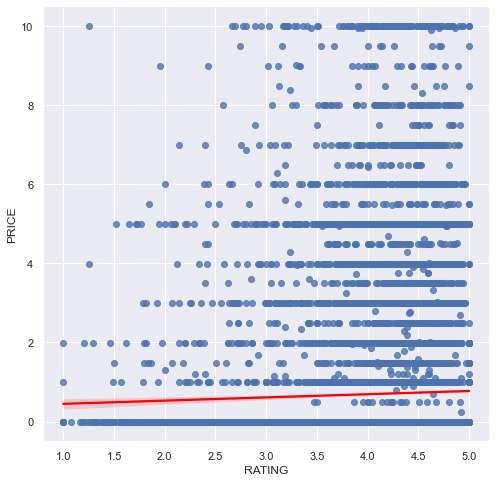

In [397]:
temp = df_cleaned[df_cleaned["PRICE"]<10]
plt.figure(figsize = (8, 8))
sb.regplot(y = "PRICE", x = "RATING", data = temp, line_kws={"color": "red"})


## `CONTENT RATING` EDA

<a id = 'installs EDA'></a>
## `INSTALLS` EDA

There are quite a handful of categories in the `INSTALLS` column, we will convert them into less categories.

In [398]:
df_cleaned['INSTALLS_GROUP'] = 'More than 10M'
df_cleaned.loc[(df_cleaned['INSTALLS'] == '1+') | (df_cleaned['INSTALLS'] == '10+') | (df_cleaned['INSTALLS'] == '50+') | 
       (df_cleaned['INSTALLS'] == '100+') | (df_cleaned['INSTALLS'] == '500+' ) | (df_cleaned['INSTALLS'] == '1,000+' ) | 
       (df_cleaned['INSTALLS'] == '5,000+' ) | (df_cleaned['INSTALLS'] == '10,000+') | (df_cleaned['INSTALLS'] == '50,000+') | 
       (df_cleaned['INSTALLS'] == '100,000+'),'INSTALLS_GROUP'] = 'Less than 100K'

df_cleaned.loc[(df_cleaned['INSTALLS'] == '500,000+') 
       | (df_cleaned['INSTALLS'] == '1,000,000+')  | (df_cleaned['INSTALLS'] == '5,000,000+') | (df_cleaned['INSTALLS'] == '5,000,000+') | 
       (df_cleaned['INSTALLS'] == '10,000,000+'),'INSTALLS_GROUP'] = 'Between 100K and 10M'
df_cleaned['INSTALLS_GROUP'] .value_counts()

Between 100K and 10M    8498
Less than 100K          7939
More than 10M           1038
Name: INSTALLS_GROUP, dtype: int64

Text(0.5, 1.0, 'Distribution of INSTALLS GROUP')

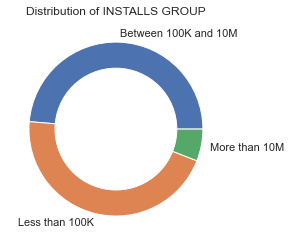

In [399]:
label = ['Between 100K and 10M', 'Less than 100K','More than 10M']
plt.pie(x = df_cleaned['INSTALLS_GROUP'].value_counts().to_frame().INSTALLS_GROUP, labels = label)
my_circle=plt.Circle((0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Distribution of INSTALLS GROUP")

### `INSTALLS_GROUP` VS `REVIEW_COUNT`

In [400]:
temp = Outliers(df_cleaned, "REVIEW_COUNT")

There is 2723 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8073.75
REVIEW_COUNT lower limit:  -4732.25


In [401]:
fig1 = go.Box(x = df_cleaned["REVIEW_COUNT"], y = df_cleaned["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["REVIEW_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

There's a significant increase in review count as the apps get more installs. <br> For apps that fall into "More than 100M" reviews, they have better tendency toward the center and are less spread out.<br> Compared to apps that have reviews "between 10K and 1M", the values are scattered across the axis.

### `INSTALLS_GROUP` VS `RATING_COUNT`

In [402]:
temp2 = Outliers(df_cleaned, "RATING_COUNT")

There is 2708 outliers in "RATING_COUNT" field.
RATING_COUNT upper limit:  139502.5
RATING_COUNT lower limit:  -82529.5


In [403]:
fig1 = go.Box(x = df_cleaned["RATING_COUNT"], y = df_cleaned["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["RATING_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

### `INSTALLS_GROUP` VS `FREE`

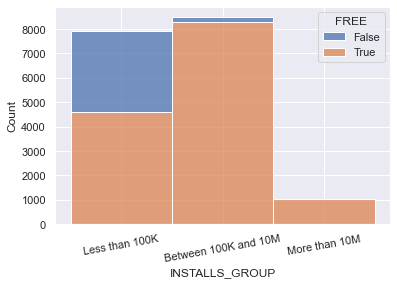

In [404]:
sb.histplot(binwidth=0.5, x="INSTALLS_GROUP", hue="FREE", data=df_cleaned, stat="count", multiple="stack", )
plt.xticks(rotation = 10)
plt.show()

Looks like more paid apps are installed less. And those that are popularly installed are free.

### `INSTALLS_GROUP` VS `AD_SUPPORTED`

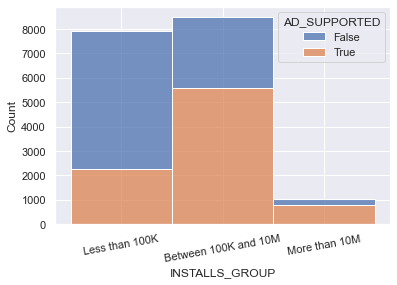

In [405]:
sb.histplot(binwidth=0.5, x="INSTALLS_GROUP", hue="AD_SUPPORTED", data=df_cleaned, stat="count", multiple="stack")
plt.xticks(rotation = 10)
plt.show()

The majority of apps are ad-supported, especially those that are installed more. This might be due to the developer are relying on advertisement as one of their income. 

### `INSTALLS_GROUP` VS `IN_APP_PURCASES`

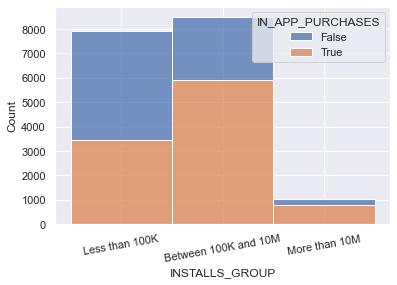

In [406]:
sb.histplot(binwidth=0.5, x="INSTALLS_GROUP", hue="IN_APP_PURCHASES", data=df_cleaned, stat="count", multiple="stack")
plt.xticks(rotation = 10)
plt.show()

It's quite common to have in app purchases for games that are popular. 

<a id = 'miscellaneous EDA'></a>
## Miscellaneous EDA

<a id = 'price EDA'></a>
### `PRICE` EDA

Create categories for `PRICE`


In [407]:
df_cleaned['PRICEBAND'] = "No Price band"
df_cleaned.loc[ df_cleaned['PRICE'] == 0, 'PRICEBAND'] = 'Free'
df_cleaned.loc[(df_cleaned['PRICE'] > 0) & (df_cleaned['PRICE'] <= 4.99), 'PRICEBAND'] = 'cheap'
df_cleaned.loc[(df_cleaned['PRICE'] > 4.99) & (df_cleaned['PRICE'] <= 14.99), 'PRICEBAND']   = 'normal'
df_cleaned.loc[(df_cleaned['PRICE'] > 14.99), 'PRICEBAND']   = 'expensive'
df_cleaned[['PRICEBAND', 'RATING']].groupby(['PRICEBAND']).mean()

,RATING
PRICEBAND,
Free,4.150217
cheap,4.187705
expensive,4.144961
normal,4.217424


In [408]:
fig = px.box(df_cleaned, x = "RATING", color = "PRICEBAND", width=800, height=400)
fig.show()

<a id = 'category EDA'></a>
### `CATEGORY` EDA

In [409]:
df_cleaned["CATEGORY"].unique()

array(['Lifestyle', 'Puzzle', 'Racing', 'Role Playing', 'Dating',
       'Beauty', 'Books & Reference', 'Video Players & Editors', 'Tools',
       'Communication', 'Simulation', 'Trivia', 'Entertainment',
       'Libraries & Demo', 'Personalization', 'Finance', 'Education',
       'News & Magazines', 'Music & Audio', 'Card', 'Travel & Local',
       'Social', 'Medical', 'Strategy', 'Arcade', 'Photography', 'Board',
       'Productivity', 'Weather', 'Health & Fitness', 'Business',
       'Action', 'Comics', 'Events', 'Casual', 'Shopping', 'Parenting',
       'Maps & Navigation', 'Sports', 'House & Home', 'Art & Design',
       'Word', 'Casino', 'Food & Drink', 'Adventure', 'Music',
       'Auto & Vehicles', 'Educational'], dtype=object)

Before we start to analyse `CATEGORY`, there are 17 categories that are considered as games, this info is gotten from the app scraper, we will identify them first.

In [410]:
games_categories = ["Puzzle", "Racing", "Role Playing", "Simulation", "Trivia", "Card", "Strategy", 
                    "Arcade", "Action", "Word", "Casino", "Adventure", "Educational", "Sports", "Board", 
                    "Casual", "Music"]
for i in range(len(df_cleaned)):
    if (df_cleaned.loc[i, "CATEGORY"] in games_categories):
        df_cleaned.loc[i, "CATEGORY"] = "Game"

What are the most populated app in Google PlayStore? How many sports app do we have in this dataset?

In [411]:
fig = px.histogram(df_cleaned, x="CATEGORY").update_xaxes(categoryorder = "total descending")
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

### Performance for each `CATEGORY`

In [412]:
fig = px.box(df_cleaned, x = "RATING", color = "CATEGORY")
fig.update_layout(
    width=1000,
    height=1200,
    margin=dict(l=20, r=40, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

<a id = 'size EDA'></a>
### `SIZE` EDA

Create categories for `SIZE`

In [413]:
df_cleaned['SIZEBAND'] = "No size band"
df_cleaned.loc[(df_cleaned['SIZE'] <= 25000000), 'SIZEBAND'] = 'small'
df_cleaned.loc[(df_cleaned['SIZE'] > 25000000) & (df_cleaned['SIZE'] <= 100000000), 'SIZEBAND']   = 'medium'
df_cleaned.loc[(df_cleaned['SIZE'] > 100000000), "SIZEBAND"] = 'large'
# df_cleaned[['SIZEBAND', 'RATING']].groupby(['SIZEBAND']).mean()

df_cleaned["SIZEBAND"].value_counts()

medium    9620
small     5227
large     2628
Name: SIZEBAND, dtype: int64

In [414]:
fig = px.box(df_cleaned, x = "RATING", color = "SIZEBAND", width=800, height=400)
fig.show()

It seems that the median of 'RATING' is lower for apps which have very large and very small 'SIZEBAND'. The median increases a small amount when the app has a medium SIZEBAND.

<a id = 'content rating EDA'></a>
### `CONTENT_RATING` EDA

Looking at the distribution of 'CONTENT_RATING'

In [415]:
print(df_cleaned["CONTENT_RATING"].value_counts())
fig = px.histogram(df_cleaned, x = "CONTENT_RATING")
fig.show()

Everyone           12674
Teen                2932
Everyone 10+         988
Mature 17+           854
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


<a id='singapore EDA'></a>
# Singapore EDA

In [416]:
sg = df_cleaned.loc[df_cleaned['COUNTRY'] == 'Singapore']
sg

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,INSTALLS_GROUP,PRICEBAND,SIZEBAND
36,1942 🚀 Free classic shooting games,4.587898,Game,73531,3418,1592,3184,5478,59859,5305.0,"5,000,000+",8991266,True,0.0,47000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone,True,True,False,488.0,1461.0,Between 100K and 10M,Free,medium
37,1945 Air Force: Airplane games,4.698586,Game,1952163,48977,19288,61575,211427,1610896,34945.0,"100,000,000+",112131352,True,0.0,190000000.0,ONESOFT,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,10.0,1099.0,More than 10M,Free,large
72,2nd phone number - call & sms,3.250000,Communication,13226,5031,648,0,1048,6499,264.0,"1,000,000+",4492802,True,0.0,24000000.0,High-quality Internet call,"10 Eunos Road 8, 01-123",Singapore,Everyone,True,True,False,112.0,949.0,Between 100K and 10M,Free,small
118,456 Survival Challenge,4.197674,Game,70831,8599,2741,4022,6131,49338,655.0,"10,000,000+",18331140,True,0.0,57000000.0,Azura Global,"Pulau Tekong, Singapore",Singapore,Teen,True,False,False,99.0,144.0,Between 100K and 10M,Free,medium
123,4Fun Lite - Live Chat Room,4.100000,Social,40144,7953,0,757,2272,29162,74.0,"10,000,000+",14874675,True,0.0,79000000.0,SpreadFun,3 FRASER STREET， 05-25，DUO TOWER，SINGAPORE,Singapore,Mature 17+,True,True,False,15.0,592.0,Between 100K and 10M,Free,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16461,Word Connect - Fun Word Game,4.739130,Game,6647,95,30,111,1027,5384,1657.0,"100,000+",408445,True,0.0,25000000.0,Classic Puzzzle Games Studio,164 Canberra Drive The Brownstone 768001,Singapore,Everyone,True,False,False,5.0,448.0,Less than 100K,Free,small
16849,Yugto,4.630769,Books & Reference,53165,1227,395,3057,7363,41123,430.0,"1,000,000+",4100184,True,0.0,26000000.0,Dreame Media,"11 WOODLANDS CLOSE 08-20, SINGAPORE",Singapore,Teen,False,True,False,84.0,461.0,Between 100K and 10M,Free,medium
16931,Zombie War Idle Defense Game,4.448276,Game,38747,3435,1145,1336,1527,31304,591.0,"5,000,000+",7033818,True,0.0,131000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,4.0,467.0,Between 100K and 10M,Free,large
17131,"iQIYI-Drama, Anime, Show",4.456103,Entertainment,829479,82545,15040,18621,38139,675134,2913.0,"50,000,000+",52838429,True,0.0,47000000.0,iQIYI,"6 SHENTON WAY, 33-00, OUE DOWNTOWN, SINGAPORE",Singapore,Everyone,True,True,False,7.0,1020.0,More than 10M,Free,medium


In [417]:
print("Number of games in Singapore:",len(sg))
print("Number of developers in Singapore:",len(sg["DEVELOPER"].unique()))

Number of games in Singapore: 204
Number of developers in Singapore: 106


It seems like there are developers that created more than one app. Let's find out which developer has the most number of apps developed.

In [418]:
temp = sg.groupby(['DEVELOPER']).size().reset_index(name='COUNT').sort_values(by = 'COUNT', ascending = False)
temp

,DEVELOPER,COUNT
3,AMANOTES PTE LTD,17
61,OneSoft Global PTE. LTD.,14
48,LIHUHU PTE. LTD.,11
23,Dreame Media,8
14,Century Games Pte. Ltd.,7
...,...,...
55,Mods for Minecraft PE by Arata Kenshin,1
54,Modo Global,1
1,ACNGames,1
17,Commandoo Jsc,1


Let's choose the top 20 apps by rating and installs in Singapore.<br>
First, we sort the singapore dataset by installation count and rating.<br>
Then, we take the top 20.

In [419]:
sg_top_20_rated = sg.sort_values(["MAX_INSTALLS", "RATING"], ascending = False)
sg_top_20_rated = sg_top_20_rated.head(20)
sg_top_20_rated

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,INSTALLS_GROUP,PRICEBAND,SIZEBAND
12467,SHAREit: Share & File Manager,4.156039,Tools,16968065,2637001,496300,690263,902531,12241970,50315.0,"1,000,000,000+",1810333419,True,0.0,51000000.0,Smart Media4U Technology Pte.Ltd.,2 VENTURE DRIVE 11-30 VISION EXCHANGE SINGAPO...,Singapore,Everyone,True,False,False,1.0,3236.0,More than 10M,Free,medium
5859,Garena Free Fire - Illuminate,3.921184,Game,106026036,23983506,2183863,3267671,5361237,71229759,529596.0,"1,000,000,000+",1183906520,True,0.0,47000000.0,Garena International I,"1 FUSIONOPOLIS PLACE, 17-10, GALAXIS, Singapore",Singapore,Mature 17+,False,True,False,27.0,1552.0,More than 10M,Free,medium
10585,PUBG MOBILE: Aftermath,4.100963,Game,41487245,7662453,839604,1185157,1759589,30040442,795148.0,"500,000,000+",600285723,True,0.0,47000000.0,Level Infinite,10 ANSON ROAD 21-07 INTERNATIONAL PLAZA SING...,Singapore,Teen,True,True,True,55.0,1450.0,More than 10M,Free,medium
8610,Magic Tiles 3,3.935281,Game,2832992,447567,142573,222086,354141,1666625,95367.0,"100,000,000+",484629075,True,0.0,47000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Everyone,True,True,False,11.0,1838.0,More than 10M,Free,medium
14803,Tiles Hop: EDM Rush!,4.168087,Game,3011736,372687,115026,176130,317346,2030547,77783.0,"100,000,000+",448568681,True,0.0,108000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Teen,True,True,False,17.0,1512.0,More than 10M,Free,large
1497,BeautyPlus-Snap Retouch Filter,4.486657,Photography,4814223,354636,91863,164567,447883,3755274,30405.0,"100,000,000+",430106338,True,0.0,219000000.0,PIXOCIAL TECHNOLOGY (SINGAPORE) PTE. LTD.,"80 Robinson Road 02-00, Singapore 068898",Singapore,Everyone,True,True,False,4.0,3159.0,More than 10M,Free,large
15953,"WPS Office-PDF,Word,Excel,PPT",4.315896,Productivity,3742522,355120,95942,204036,443825,2643599,56023.0,"100,000,000+",428810135,True,0.0,126000000.0,WPS SOFTWARE PTE. LTD.,6 RAFFLES QUAY 14-06 SINGAPORE,Singapore,Everyone,True,True,False,11.0,3883.0,More than 10M,Free,large
16115,WeChat,3.748641,Communication,6103916,1400688,216129,380447,626143,3480509,212964.0,"100,000,000+",366352173,True,0.0,396000000.0,WeChat International Pte. Ltd.,"10 Anson Rd, 21-07, International Plaza, Sing...",Singapore,Everyone,False,True,False,11.0,4055.0,More than 10M,Free,large
10559,PLAYit-All in One Video Player,4.642533,Video Players & Editors,3729916,174007,52639,112895,253109,3137266,13610.0,"100,000,000+",265228236,True,0.0,28000000.0,PLAYIT TECHNOLOGY PTE. LTD.,"60 PAYA LEBAR ROAD, 08-10,PAYA LEBAR SQUARE, S...",Singapore,Everyone,True,True,False,11.0,851.0,More than 10M,Free,medium
6444,"Hago-Talk, Live & Play Games",4.256812,Social,6045675,560542,157685,504453,767615,4055380,6078.0,"100,000,000+",257141759,True,0.0,47000000.0,HAGO,8 TEMASEK BOULEVARD 08-05 SUNTEC TOWER THREE ...,Singapore,Mature 17+,True,True,False,14.0,1267.0,More than 10M,Free,medium


### Singapore Top performing developers
We will determine the reputation of a developer by evaluating their sum of all of their application's max installation count and average rating of each application.

In [420]:
data2 = sg[["APP_NAME", "DEVELOPER", "RATING", "MAX_INSTALLS"]]
avg_rating = data2.groupby(["DEVELOPER"])["RATING"].mean().to_frame()
sum_installs = data2.groupby(["DEVELOPER"])["MAX_INSTALLS"].sum().to_frame()
sg_dev = pd.merge(avg_rating, sum_installs, on = "DEVELOPER")
sg_dev.sort_values(["RATING", "MAX_INSTALLS"], ascending = False).head(10)

,RATING,MAX_INSTALLS
DEVELOPER,,
2021 Yearly Selection Cloud Gaming - Netboom Ltd.,4.888230,19820120
PLAYNEXX GAMES,4.842593,500701
SM Health Team,4.841572,5633058
BOUNCE ENTERTAINMENT COMPANY LIMITED,4.830189,204942
DB RR STUDIO,4.825671,5796815
AlphaPlay Games,4.770000,40542
Wood Puzzle Sudoku Games,4.769841,1226129
Classic Puzzzle Games Studio,4.739130,408445
Rhythm Games Star Studio,4.737864,1372366


<a id='fang EDA'></a>
# FANG EDA

In [421]:
facebook_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Meta Platforms, Inc."]
amazon_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Amazon Mobile LLC"]
netflix_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Netflix, Inc."]
google_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Google LLC"]

FANG = [facebook_apps, amazon_apps, netflix_apps, google_apps]
stringFANG = ["Facebook", "Amazon", "Netflix", "Google"]

### How many apps did each company developed?


In [422]:
print("Facebook has developed", len(facebook_apps), "app(s).")
print("Amazon has developed", len(amazon_apps), "app(s).")
print("Netflix has developed", len(netflix_apps), "app(s).")
print("Google has developed", len(google_apps), "app(s).")

Facebook has developed 10 app(s).
Amazon has developed 17 app(s).
Netflix has developed 4 app(s).
Google has developed 65 app(s).


### How's the app rating for the company?

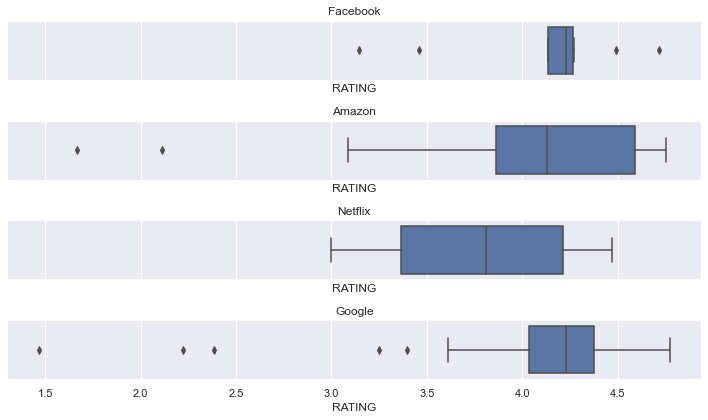

In [423]:
fig, axes = plt.subplots(4, 1, figsize = (10, 6), sharex = True)
x = 0
for i in FANG:
    sb.boxplot(data = i, x = "RATING", ax = axes[x])
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()


### What kind of apps do such great company develop?

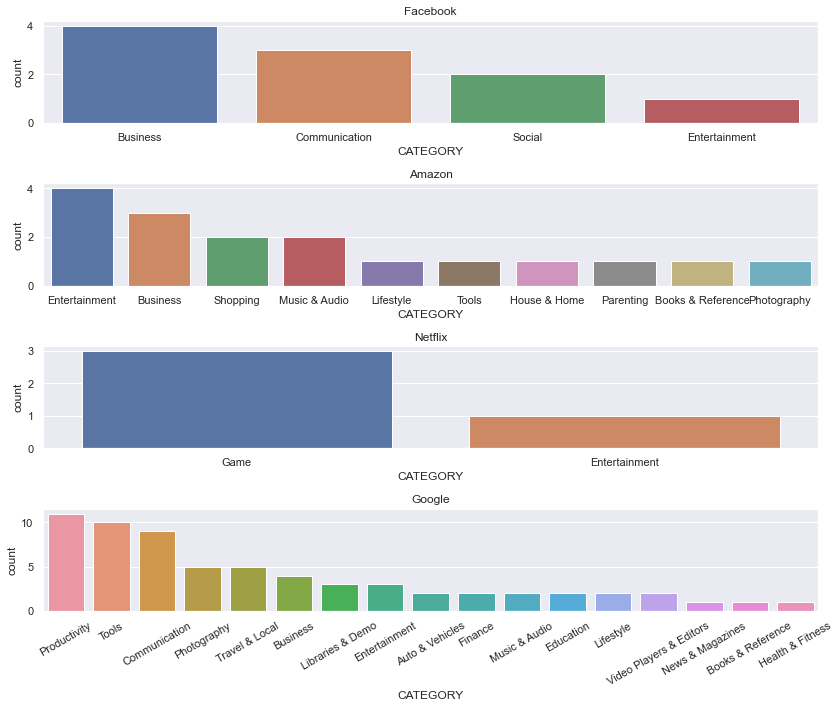

In [424]:
fig, axes = plt.subplots(4, 1, figsize = (12, 10))
x = 0
for i in FANG:
    sb.countplot(x = "CATEGORY", data = i, ax = axes[x] , order = i["CATEGORY"].value_counts().index)
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()


### Let's find out how each category did in each company, shall we?

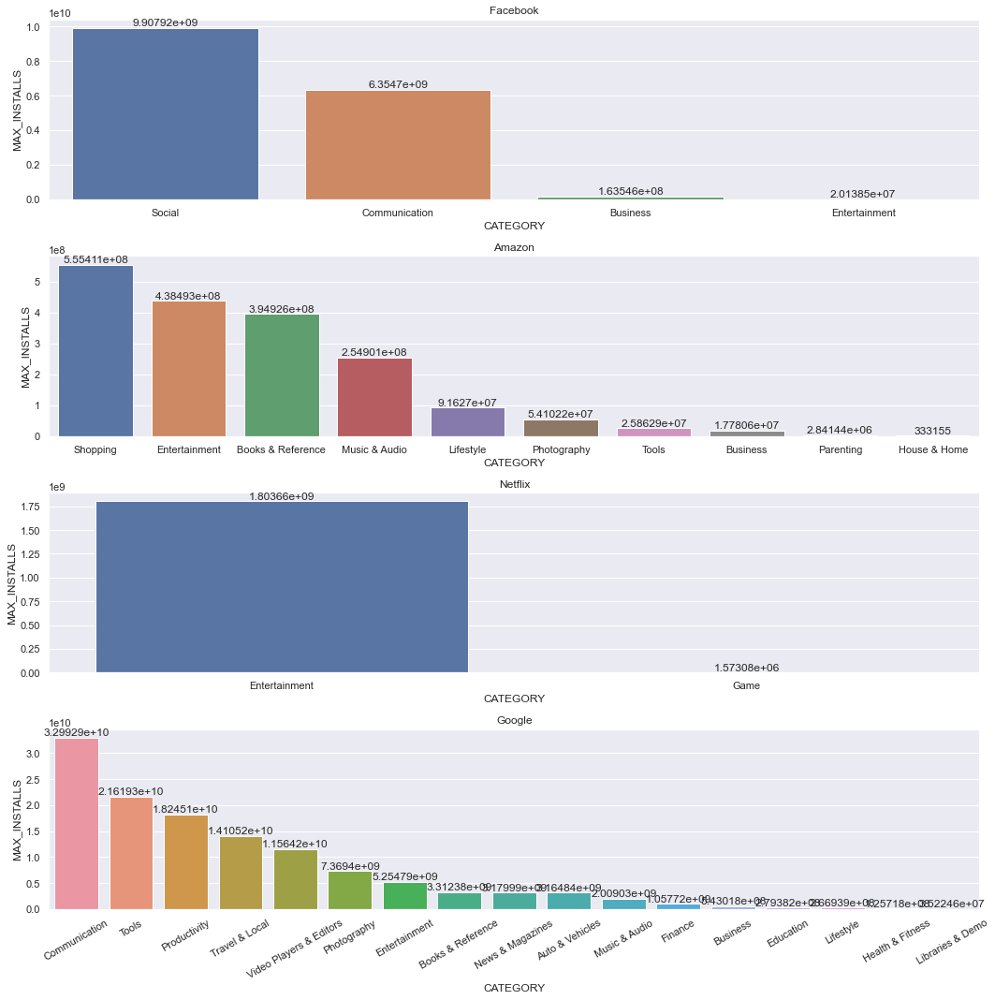

In [425]:
fb2 = facebook_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
amz2 = amazon_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
net2 = netflix_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
goog2 = google_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
FANG2 = [fb2, amz2, net2, goog2]

fig, axes = plt.subplots(4, 1, figsize = (15, 15))
x = 0
for i in FANG2:
    ax = sb.barplot(x = "CATEGORY", y = 'MAX_INSTALLS', data = i, ax = axes[x] , order = i.sort_values('MAX_INSTALLS', ascending = False).CATEGORY)
    ax.bar_label(ax.containers[0])
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()

In fact, it's very intuitive that Facebook's most well-known app falls under the 'Social' category because Facebook is a social media platform. <br>
And Amazon is a e-shopping platform and Netflix is an entertainment platform.<br>And Google is the leading platform in tools, productivity and communication.

<a id ='geospatial analysis'></a>
# Geospatial Analysis
We will use the same dataset but will drop those rows without values in the COUNTRY column.

In [426]:
df_country = df_cleaned.dropna(subset=['COUNTRY'])
df_country.reset_index(drop= True, inplace=True)
df_country.shape

(4840, 27)

In [427]:
df_country[df_country["COUNTRY"] == "Luxembourg"]

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,INSTALLS_GROUP,PRICEBAND,SIZEBAND
3641,Skype,4.132845,Communication,11442600,1529613,400685,670410,1261164,7580728,419372.0,"1,000,000,000+",1874038869,True,0.0,47000000.0,Skype,"Skype Software S.à.r.l, 23 – 29 Rives de Claus...",Luxembourg,Everyone,False,True,True,7.0,4173.0,More than 10M,Free,medium


### 1. Comparing the average of max installs of the apps developed by each country.

In [428]:
max_installs_by_mean = pd.DataFrame(df_country.groupby(["COUNTRY"])["MAX_INSTALLS"].agg("mean"))
max_installs_by_mean.rename(columns={'MAX_INSTALLS': 'MEAN_MAX_INSTALLS'}, inplace = True)
max_installs_by_mean = max_installs_by_mean.nlargest(10,['MEAN_MAX_INSTALLS'])
max_installs_by_mean = max_installs_by_mean.reset_index()
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS
0,Luxembourg,1.874039e+09
1,Usa,1.305975e+08
2,Ireland,7.368652e+07
3,South Korea,5.526386e+07
4,Oman,5.204643e+07
5,Singapore,4.980529e+07
6,Switzerland,4.265305e+07
7,Cyprus,3.512464e+07
8,France,2.942811e+07
9,Lithuania,2.183506e+07


In [429]:
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
max_installs_by_mean['SIZE'] = sequence
max_installs_by_mean
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS,SIZE
0,Luxembourg,1.874039e+09,1000
1,Usa,1.305975e+08,900
2,Ireland,7.368652e+07,800
3,South Korea,5.526386e+07,700
4,Oman,5.204643e+07,600
5,Singapore,4.980529e+07,500
6,Switzerland,4.265305e+07,400
7,Cyprus,3.512464e+07,300
8,France,2.942811e+07,200
9,Lithuania,2.183506e+07,100


In [430]:
fig = px.bar(max_installs_by_mean, x='COUNTRY', y='MEAN_MAX_INSTALLS')
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

We have grouped the dataset by country and find their mean of max installs per country. Then we will proceed with picking the top 10 countries. <br>
Usa, South Korea, Singapore, France, Finland, China, Turkey and Hong Kong all remains on the list.

In [431]:
fig = px.scatter_geo(max_installs_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", size = 'MEAN_MAX_INSTALLS',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

### 2. Comparing the average rating of the apps developed by each country.
We will do the same thing, but this time we will explore on the rating.

In [432]:
rating_by_mean = pd.DataFrame(df_country.groupby(["COUNTRY"])["RATING"].agg("mean"))
rating_by_mean.rename(columns={'RATING': 'MEAN_RATING'}, inplace = True)

In [433]:
fig = px.box(rating_by_mean, x = "MEAN_RATING",points="all")
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

This figure gives us 2 types of visualizations, boxplot and swarmplot. Which provide us an insight where the majority of data lies in the rating spectrum. Which is 4 to 4.5. <br>
Notice there's a few outliers that have rating that are lower than 3.5. Let's find out which countries are those.

In [434]:
lowest_mean_rating = rating_by_mean[rating_by_mean['MEAN_RATING'] < 3.5]
lowest_mean_rating

,MEAN_RATING
COUNTRY,
Belize,3.288830
Iceland,3.462838
Morocco,2.936170
Uganda,2.200000


In [435]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
rating_by_mean = rating_by_mean.reset_index()
rating_by_mean

,COUNTRY,MEAN_RATING
0,Montenegro,4.800969
1,Moldova,4.742574
2,Venezuela,4.670000
3,Albania,4.633178
4,Costa Rica,4.566433
5,Belarus,4.547344
6,Nepal,4.540000
7,Peru,4.535119
8,Tanzania,4.527273
9,Dominican Republic,4.511111


In [436]:
fig = px.bar(rating_by_mean, x='COUNTRY', y='MEAN_RATING')
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

In [437]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
rating_by_mean['SIZE'] = sequence
rating_by_mean


,COUNTRY,MEAN_RATING,SIZE
0,Montenegro,4.800969,1000
1,Moldova,4.742574,900
2,Venezuela,4.670000,800
3,Albania,4.633178,700
4,Costa Rica,4.566433,600
5,Belarus,4.547344,500
6,Nepal,4.540000,400
7,Peru,4.535119,300
8,Tanzania,4.527273,200
9,Dominican Republic,4.511111,100


In [97]:
fig = px.scatter_geo(rating_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", hover_data=["MEAN_RATING"], size = 'SIZE',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

Compared to the previous map, this map's bubbles are more consistent and we can clearly see which bubble is bigger. Because we introduced a rank metric called SIZE which will change the bubble size according the ranking of the country instead of the mean ratings. 

## Model Building

First we identify the which features are usable in the dataset:
1. `RATING` (num)
2. `CATEGORY` (cat)
3. `INSTALLS_GROUP` (cat)
4. `SIZEBAND` (cat)
5. `FREE` (cat)
6. `PRICEBAND` (cat)
7. `AD_SUPPORTED` (cat)
8. `CONTENT_RATING` (cat)
9. `IN_APP_PURCHASES` (cat)
10. `EDITORS_CHOICE` (cat)

Data preprocesssing (handle null values -> handle categorical data -

In [438]:
feature_list = ["RATING_COUNT", "RATING", "CATEGORY", "INSTALLS_GROUP", "SIZEBAND", "FREE", "PRICEBAND", "AD_SUPPORTED", "CONTENT_RATING", "IN_APP_PURCHASES", "EDITORS_CHOICE"]
model_df = df_cleaned[feature_list].copy()
model_df.head()

,RATING_COUNT,RATING,CATEGORY,INSTALLS_GROUP,SIZEBAND,FREE,PRICEBAND,AD_SUPPORTED,CONTENT_RATING,IN_APP_PURCHASES,EDITORS_CHOICE
0,68,3.933333,Lifestyle,Less than 100K,small,False,normal,False,Everyone,False,False
1,975,4.740000,Game,Less than 100K,medium,False,cheap,False,Everyone,False,False
2,229679,4.434152,Game,Between 100K and 10M,large,True,Free,True,Everyone,True,False
3,14932,4.463476,Game,Between 100K and 10M,medium,True,Free,False,Teen,True,False
4,708,2.550000,Dating,Less than 100K,small,True,Free,False,Mature 17+,True,False


Handling null values

In [439]:
model_df.isna().sum()

RATING_COUNT        0
RATING              0
CATEGORY            0
INSTALLS_GROUP      0
SIZEBAND            0
FREE                0
PRICEBAND           0
AD_SUPPORTED        0
CONTENT_RATING      0
IN_APP_PURCHASES    0
EDITORS_CHOICE      0
dtype: int64

Seems like there are no null values in our dataset :)

In [440]:
model_df["INSTALLS_GROUP"].value_counts()

Between 100K and 10M    8498
Less than 100K          7939
More than 10M           1038
Name: INSTALLS_GROUP, dtype: int64

In [441]:
benchmark = 5000
model_df = model_df[model_df["RATING_COUNT"] > benchmark]
model_df.reset_index(inplace=True, drop=True)
model_df.shape

(9476, 11)

### Data Preprocessing

From eda, we noticed that RATING is skewed towards 4 and 5, so we categorize the rating into low (below 3), medium (3.5-4.5) and high (above 4.5)

In [442]:
model_df["RATING_GROUP"] = round(model_df["RATING"], 0) 
for i in range(model_df.shape[0]):
    if (model_df.loc[i, "RATING_GROUP"] <= 3):
        model_df.loc[i, "RATING_GROUP"]  = 3
        
#Categorize
model_df.loc[model_df["RATING_GROUP"] ==3 , "RATING_GROUP"] = "Low"
model_df.loc[model_df["RATING_GROUP"] ==4 , "RATING_GROUP"] = "Medium"
model_df.loc[model_df["RATING_GROUP"] ==5 , "RATING_GROUP"] = "High"
model_df.drop(["RATING"], axis = 1,inplace= True)
model_df["RATING_GROUP"].value_counts()

Medium    5565
High      3390
Low        521
Name: RATING_GROUP, dtype: int64

For `CATEGORY`, we noticed from eda that most apps falls under "Game" category, with that we change the category values to either "Game" or "Non Game"

In [253]:
model_df.loc[model_df["CATEGORY"] != "Game", "CATEGORY"] = "Non Game"
model_df["CATEGORY"].value_counts()

Non Game    5222
Game        4254
Name: CATEGORY, dtype: int64

For `CONTENT_RATING`, we just include Everyone, Teens and Adult

In [443]:
model_df['CONTENT_RATING'] = model_df['CONTENT_RATING'].replace('Mature 17+',"Adults")
model_df['CONTENT_RATING'] = model_df['CONTENT_RATING'].replace('Adults only 18+',"Adults")
model_df['CONTENT_RATING'] = model_df['CONTENT_RATING'].replace('Everyone 10+',"Everyone")
model_df["CONTENT_RATING"].value_counts()

Everyone    7118
Teen        1851
Adults       507
Name: CONTENT_RATING, dtype: int64

#### Handling categorical values

Before we continue, our categorical variables are further divided into 2 types —
- Ordinal categorical variables - `INSTALLS_GROUP`, `SIZEBAND`, `PRICEBAND`, `RATING_GROUP`,`FREE`, `AD_SUPPORTED`, `IN_APP_PURCHASES`, `EDITORS_CHOICE`
- Nominal categorical variable - `CATEGORY`,  `CONTENT_RATING`

In [444]:
nominal_cat = ["CONTENT_RATING", "CATEGORY"]
ordinal_cat = ["INSTALLS_GROUP", "SIZEBAND", "PRICEBAND", "RATING_GROUP","FREE","AD_SUPPORTED", "IN_APP_PURCHASES","EDITORS_CHOICE"]

**Handling Ordinal Categorical Variables**

In [445]:
ig_mapping = {"Less than 100K": 0, "Between 100K and 10M": 1, "More than 10M": 2}
pb_mapping = {"Free": 0, "cheap": 1, "normal": 2, "expensive": 3}
sb_mapping = {"small": 0, "medium": 1, "large": 2 }
rg_mapping = {"Low": 0, "Medium": 1, "High": 2}
free_mapping = {False: 0, True: 1}
ads_mapping = {False: 0, True: 1}
iap_mapping = {False: 0, True: 1}
ec_mapping = {False: 0, True: 1}
 
model_df["INSTALLS_GROUP"] = model_df["INSTALLS_GROUP"].map(ig_mapping)
model_df["PRICEBAND"] = model_df["PRICEBAND"].map(pb_mapping)
model_df["SIZEBAND"] = model_df["SIZEBAND"].map(sb_mapping)
model_df["RATING_GROUP"] = model_df["RATING_GROUP"].map(rg_mapping)
model_df["FREE"] = model_df["FREE"].map(free_mapping)
model_df["AD_SUPPORTED"] = model_df["AD_SUPPORTED"].map(ads_mapping)
model_df["IN_APP_PURCHASES"] = model_df["IN_APP_PURCHASES"].map(iap_mapping)
model_df["EDITORS_CHOICE"] = model_df["EDITORS_CHOICE"].map(ec_mapping)

model_df[["INSTALLS_GROUP", "PRICEBAND", "SIZEBAND", "RATING_GROUP","FREE","AD_SUPPORTED", "IN_APP_PURCHASES","EDITORS_CHOICE"]].head()

,INSTALLS_GROUP,PRICEBAND,SIZEBAND,RATING_GROUP,FREE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE
0,1,0,2,1,1,1,1,0
1,1,0,1,1,1,0,1,0
2,1,0,2,2,1,0,1,0
3,2,0,0,1,1,0,1,0
4,1,0,2,1,1,1,0,0


**Handling Nominal Categorical Variables**

In [446]:
# Import the encoder from sklearn
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()

# OneHotEncoding of categorical predictors 
model_df_cat = model_df[nominal_cat]
ohe.fit(model_df_cat)
model_df_cat_ohe = pd.DataFrame(ohe.transform(model_df_cat).toarray(), 
                                  columns=ohe.get_feature_names_out(model_df_cat.columns))

# Check the encoded variables
model_df_cat_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9476 entries, 0 to 9475
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CONTENT_RATING_Adults             9476 non-null   float64
 1   CONTENT_RATING_Everyone           9476 non-null   float64
 2   CONTENT_RATING_Teen               9476 non-null   float64
 3   CATEGORY_Art & Design             9476 non-null   float64
 4   CATEGORY_Auto & Vehicles          9476 non-null   float64
 5   CATEGORY_Beauty                   9476 non-null   float64
 6   CATEGORY_Books & Reference        9476 non-null   float64
 7   CATEGORY_Business                 9476 non-null   float64
 8   CATEGORY_Comics                   9476 non-null   float64
 9   CATEGORY_Communication            9476 non-null   float64
 10  CATEGORY_Dating                   9476 non-null   float64
 11  CATEGORY_Education                9476 non-null   float64
 12  CATEGO

In [447]:
# Combine all features
model_df_ord = model_df[ordinal_cat]
model_df_encoded = pd.concat([ model_df_cat_ohe, model_df_ord], 
                           sort = False, axis = 1).reindex(index=model_df_ord.index)

# Check the final dataframe
model_df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9476 entries, 0 to 9475
Data columns (total 43 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CONTENT_RATING_Adults             9476 non-null   float64
 1   CONTENT_RATING_Everyone           9476 non-null   float64
 2   CONTENT_RATING_Teen               9476 non-null   float64
 3   CATEGORY_Art & Design             9476 non-null   float64
 4   CATEGORY_Auto & Vehicles          9476 non-null   float64
 5   CATEGORY_Beauty                   9476 non-null   float64
 6   CATEGORY_Books & Reference        9476 non-null   float64
 7   CATEGORY_Business                 9476 non-null   float64
 8   CATEGORY_Comics                   9476 non-null   float64
 9   CATEGORY_Communication            9476 non-null   float64
 10  CATEGORY_Dating                   9476 non-null   float64
 11  CATEGORY_Education                9476 non-null   float64
 12  CATEGO

Upsampling RATING_GROUP to balance low, medium and high apps

### Machine learning

Predicting Rating

In [448]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,ConfusionMatrixDisplay,classification_report
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [454]:
# Extract Response and Predictors
response = "INSTALLS_GROUP"
y = pd.DataFrame(model_df_encoded[response])
X = pd.DataFrame(model_df_encoded.drop(["INSTALLS_GROUP", "RATING_GROUP"], axis = 1))

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=20)

In [451]:
# Support Vector Machines

svc = SVC()
svc.fit(X_train, y_train)
Y_pred = svc.predict(X_test)
acc_svc = round(svc.score(X_train, y_train) * 100, 2)
acc_svc

62.72

In [455]:
# Random Forest

random_forest = RandomForestClassifier(n_estimators=100)
random_forest.fit(X_train, y_train)
y_pred = random_forest.predict(X_test)
random_forest.score(X_train, y_train)
acc_random_forest = round(random_forest.score(X_train, y_train) * 100, 2)
acc_random_forest

83.65

In [453]:
# Decision Tree

decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train)
y_pred = decision_tree.predict(X_test)
acc_decision_tree = round(decision_tree.score(X_train, y_train) * 100, 2)
acc_decision_tree

68.43

In [456]:
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.66      0.43      0.52       185
           1       0.81      0.96      0.88      1477
           2       0.42      0.07      0.12       234

    accuracy                           0.80      1896
   macro avg       0.63      0.49      0.51      1896
weighted avg       0.75      0.80      0.75      1896

[[  80  104    1]
 [  42 1414   21]
 [   0  218   16]]


In [575]:
param_grid = {'C':[10,100,1000],'gamma':[1,0.1,0.001,0.0001], 'kernel':['linear','rbf']}
grid = GridSearchCV(SVC(),param_grid,refit = True, verbose=2)

In [576]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   3.7s
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   4.1s
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   4.9s
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   3.8s
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   4.5s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   7.4s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   6.6s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   6.5s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   6.4s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   7.3s
[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   3.8s
[CV] END .....................C=10, gamma=0.1, 

GridSearchCV(estimator=SVC(),
             param_grid={'C': [10, 100, 1000], 'gamma': [1, 0.1, 0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             verbose=2)

Predicting Installs

In [577]:
grid.best_params_

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

In [578]:
predic = grid.predict(X_test)

In [579]:
print(classification_report(y_test,predic))
print(confusion_matrix(y_test, predic))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       407
           1       0.56      0.99      0.71      1932
           2       0.49      0.03      0.05      1156

    accuracy                           0.55      3495
   macro avg       0.35      0.34      0.25      3495
weighted avg       0.47      0.55      0.41      3495

[[   0  401    6]
 [   0 1908   24]
 [   0 1127   29]]
